# Data preparation

The notebook performs preparation and exploratory analysis on Human Activity Recognition dataset, which basically consists of 9 signal datasets, containing sequences collected from various sensors.

Dataset can be downloaded from: https://archive.ics.uci.edu/ml/datasets/human+activity+recognition+using+smartphones

Raw data are extracted into numpy arrays, then we can observe sample timeseries visualized using interactive plots as well as Fast Fourier Transforms (FFT) to see which signals carry the most information.

Finally, using Continuous Wavelet Transform (CWT) signals are decomposed and stored as raw frequencies and power transformed. 



In [1]:
import numpy as np
import pywt
import os
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from scipy.fft import fft, fftfreq
from functools import partial

from collections import Counter
import uuid
from collections import OrderedDict

/opt/homebrew/Caskroom/miniforge/base/envs/TSA_wavelet/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
# Manage dataset directory

TRAIN_ROOT = "UCI HAR Dataset/train"
TRAIN_DATA_DIR = os.path.join(TRAIN_ROOT, "Inertial Signals")
TRAIN_FILES = (
    "body_acc_x_train.txt",
    "body_acc_y_train.txt",
    "body_acc_z_train.txt",
    "body_gyro_x_train.txt",
    "body_gyro_y_train.txt",
    "body_gyro_z_train.txt",
    "total_acc_x_train.txt",
    "total_acc_y_train.txt",
    "total_acc_z_train.txt",
)
TRAIN_LABELS_PATH = os.path.join(TRAIN_ROOT, "y_train.txt")

TEST_ROOT = "UCI HAR Dataset/test"
TEST_DATA_DIR = os.path.join(TEST_ROOT, "Inertial Signals")
TEST_FILES = (
    "body_acc_x_test.txt",
    "body_acc_y_test.txt",
    "body_acc_z_test.txt",
    "body_gyro_x_test.txt",
    "body_gyro_y_test.txt",
    "body_gyro_z_test.txt",
    "total_acc_x_test.txt",
    "total_acc_y_test.txt",
    "total_acc_z_test.txt",
)
TEST_LABELS_PATH = os.path.join(TEST_ROOT, "y_test.txt")
LABELS_MAPPING = OrderedDict()
LABELS_MAPPING[0] = "Walking"
LABELS_MAPPING[1] = "Walking upstairs"
LABELS_MAPPING[2] = "Walking downstairs"
LABELS_MAPPING[3] = "Sitting"
LABELS_MAPPING[4] = "Standing"
LABELS_MAPPING[5] = "Laying"

In [7]:
# define signal processing constants
NUM_TIMEPOINTS = 128
SAMPLING_FREQUENCY = 50
WINDOW_LEN = NUM_TIMEPOINTS / SAMPLING_FREQUENCY
SIGNAL_NAMES = (
    "body_acc_x",
    "body_acc_y",
    "body_acc_z",
    "body_gyro_x",
    "body_gyro_y",
    "body_gyro_z",
    "total_acc_x",
    "total_acc_y",
    "total_acc_z",
)
SIGNAL_EXTRACTORS = OrderedDict()

for i, name in enumerate(SIGNAL_NAMES):
    SIGNAL_EXTRACTORS[name] = slice(i * NUM_TIMEPOINTS, (i + 1) * NUM_TIMEPOINTS)

SCALEOGRAM_EXTRACTORS = OrderedDict()

for i, name in enumerate(SIGNAL_NAMES):
    SCALEOGRAM_EXTRACTORS[name] = i

SCALEOGRAM_SHAPE = (128, 128)
SCALES = list(range(1, SCALEOGRAM_SHAPE[1] + 1))

SCALEOGRAM_POWER_DIR = "scaleograms_power"
SCALEOGRAM_RAW_DIR = "scaleograms_raw"

In [11]:
# define helper functions

def make_dataset(files_names, root_dir):
    """
        returns complete numpy array created from separately stored signal data
    """
    signals = []
    for filename in files_names:
        path = os.path.join(root_dir, filename)
        signals.append(np.loadtxt(path))

    return np.hstack(signals)


def shift_label(index):
    """
        Labels are numerated from 1 instead of 0 which may cause problems
        when computing loss, this will shift them to start with 0
    """
    return index - 1


def make_annotations(root_dir, filename):
    labels_path = os.path.join(root_dir, filename)
    labels = np.loadtxt(labels_path, dtype=int)
    return np.array(list(map(shift_label, labels)), dtype=int)


def extract_signal(x, signal_name):
    return x[SIGNAL_EXTRACTORS[signal_name]]


def extract_scaleogram(x, signal_name):
    index = SCALEOGRAM_EXTRACTORS[signal_name]
    return x[index]

def to_scaleogram(x, wavelet, scales, compute_power=True):
    """
        returns numpy array with scaleogram data using Continuous Wavelet Transforms
        as well as calculated frequencies.
        
        - scales -- array of scales to use
        - wavelet -- Wavelet object or string indicating wavelet name. 
        - compute_power -- if set to True, it returns scaleograms as Power transforms
    """
    scaleograms = []
    for signal_extractor in SIGNAL_EXTRACTORS.values():
        signal = x[signal_extractor]
        coefs, freqs = pywt.cwt(signal, scales, sampling_period=1.0 / SAMPLING_FREQUENCY, wavelet=wavelet)
        if compute_power:
            coefs = np.abs(coefs) ** 2
        scaleograms.append(coefs)

    return np.array(scaleograms), freqs


def make_scaleograms(X, wavelet, scales, compute_power=True):
    for sample in X:
        scaleogram, freqs = to_scaleogram(sample, wavelet, scales, compute_power)
        yield scaleogram, freqs

In [18]:
def plot_raw(figure, x, y, row, col):
    """
        plot interactive figure using plotly
    """
    return figure.add_trace(go.Line(x=x, y=y), row=row, col=col)


def plot_fft(figure, _, y, row, col):
    """
        create FFT (Fast Fourier Transform) barplot from given data
        as interactive plot using plotly
    """
    y_fft = fft(y)[:NUM_TIMEPOINTS // 2]
    y_fft = (2.0 / NUM_TIMEPOINTS) * np.abs(y_fft)
    y_freqs = fftfreq(NUM_TIMEPOINTS, 1.0 / SAMPLING_FREQUENCY)[:NUM_TIMEPOINTS // 2]

    return figure.add_trace(go.Bar(x=y_freqs, y=y_fft), row=row, col=col)


def plot_scaleogram(figure, _, y, row, col, x_ax_vals, y_ax_vals):
    """
        plot scaleogram from given data as interactive plot using plotly
    """
    figure.add_trace(go.Heatmap(z=y, x=x_ax_vals, y=y_ax_vals, showscale=False, colorscale="Rainbow"), row=row,
                     col=col)

    return figure

def plot_random_sample(data, title, plotting_func, signal_extractor=extract_signal, x_title="", y_title=""):
    x = np.linspace(0, WINDOW_LEN, NUM_TIMEPOINTS)
    sample_index = np.random.randint(0, len(data))
    sample = data[sample_index]
    label_name = LABELS_MAPPING[y_train[sample_index]]
    title = title.format(label_name)

    fig = make_subplots(rows=3, cols=3, subplot_titles=SIGNAL_NAMES, x_title=x_title, y_title=y_title)
    for i, signal_name in enumerate(SIGNAL_NAMES):
        row = i // 3 + 1
        col = i % 3 + 1
        signal = signal_extractor(sample, signal_name)
        plotting_func(fig, x, signal, row=row, col=col)

    fig.update_layout(
        width=800,
        height=600,
        showlegend=False,
        autosize=True,
        # margin_l=25,
        # margin_r=25,
        title_text=title,
    )
    return fig

In [9]:
# create dataset for training

X_train = make_dataset(TRAIN_FILES, TRAIN_DATA_DIR)
y_train = make_annotations(TRAIN_ROOT, filename="y_train.txt")

X_test = make_dataset(TEST_FILES, TEST_DATA_DIR)
y_test = make_annotations(TEST_ROOT, filename="y_test.txt")

In [10]:
print(f"Train dataset shape: {X_train.shape}")
print(f"Test dataset shape: {X_test.shape}")

print(f"Train labels shape: {y_train.shape}")
print(f"Test labels shape: {y_test.shape}")

Train dataset shape: (7352, 1152)
Test dataset shape: (2947, 1152)
Train labels shape: (7352,)
Test labels shape: (2947,)


### Plot data

Plot sample data signals and their FFT for randomly selected position. 

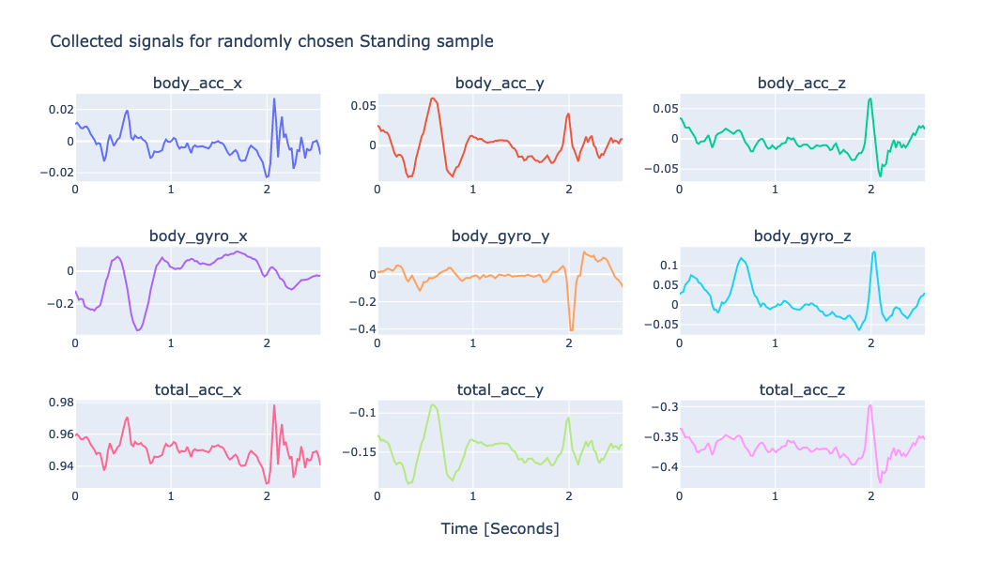

In [19]:
plot_random_sample(
    X_train,
    title="Collected signals for randomly chosen {} sample",
    x_title="Time [Seconds]",
    plotting_func=plot_raw
)

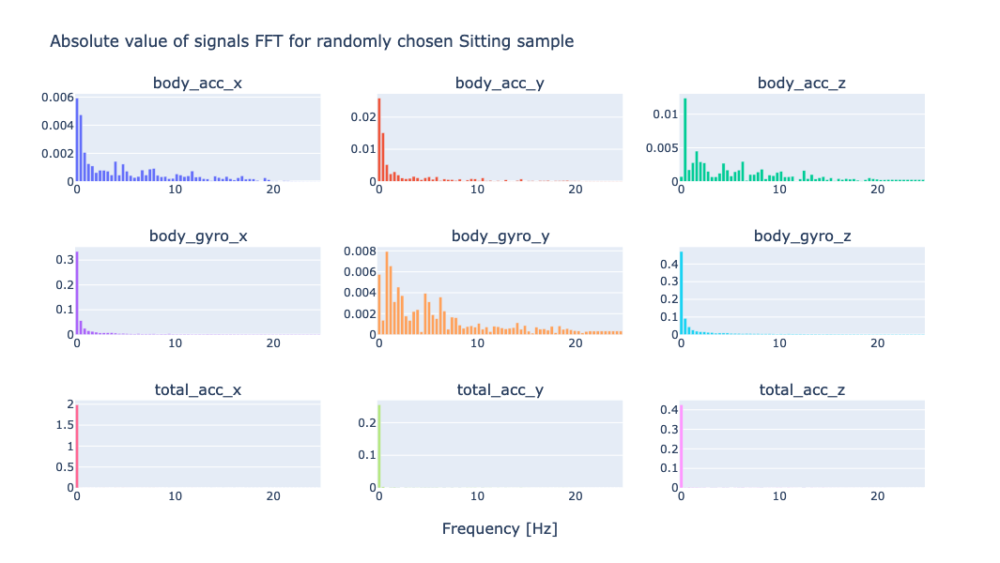

In [20]:
plot_random_sample(
    X_train,
    title="Absolute value of signals FFT for randomly chosen {} sample",
    x_title="Frequency [Hz]",
    plotting_func=plot_fft
)

### Wavelet transformation

Perform Continuous Wavelet Transform (CWT) on data


In [22]:
# Show available wavelets
pywt.wavelist(kind="continuous")


['cgau1',
 'cgau2',
 'cgau3',
 'cgau4',
 'cgau5',
 'cgau6',
 'cgau7',
 'cgau8',
 'cmor',
 'fbsp',
 'gaus1',
 'gaus2',
 'gaus3',
 'gaus4',
 'gaus5',
 'gaus6',
 'gaus7',
 'gaus8',
 'mexh',
 'morl',
 'shan']

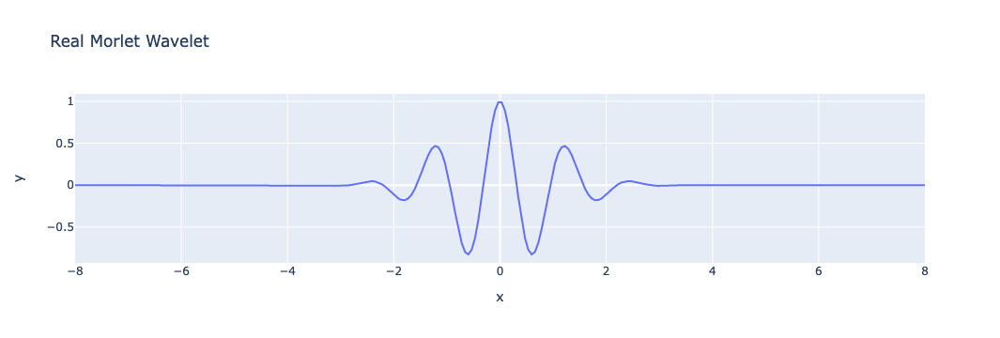

In [23]:
morlet_wavelet = pywt.ContinuousWavelet("morl")
wav_y, wav_x = morlet_wavelet.wavefun()
px.line(x=wav_x, y=wav_y, title="Real Morlet Wavelet")


In [49]:
# Process training and testing raw data (without Power transformation)

def process_dataset(dataset, wavelet, scales, path_root, compute_power=False):
    for i, (scaleogram, frequencies) in enumerate(make_scaleograms(dataset, wavelet, scales, compute_power=compute_power)):
        if i % 500 == 0:
            print(f"Processing sample number {i}")
        if not compute_power:
            subdir = SCALEOGRAM_RAW_DIR
        else:
            subdir = SCALEOGRAM_POWER_DIR
        pathset = os.path.join(path_root, subdir)
        if not(os.path.exists(pathset)):
            os.mkdir(pathset)
        np.save(os.path.join(pathset, f"{i}.npy"), scaleogram)

# Process train dataset
process_dataset(X_train, morlet_wavelet, SCALES, TRAIN_ROOT)
# process_dataset(X_train, morlet_wavelet, SCALES, TRAIN_ROOT, compute_power=True)


# Process test dataset
process_dataset(X_test, morlet_wavelet, SCALES, TEST_ROOT)
# process_dataset(X_test, morlet_wavelet, SCALES, TEST_ROOT, compute_power=True)


Processing sample number 0
Processing sample number 500
Processing sample number 1000
Processing sample number 1500
Processing sample number 2000
Processing sample number 2500
Processing sample number 3000
Processing sample number 3500
Processing sample number 4000
Processing sample number 4500
Processing sample number 5000
Processing sample number 5500
Processing sample number 6000
Processing sample number 6500
Processing sample number 7000
Processing sample number 0
Processing sample number 500
Processing sample number 1000
Processing sample number 1500
Processing sample number 2000
Processing sample number 2500


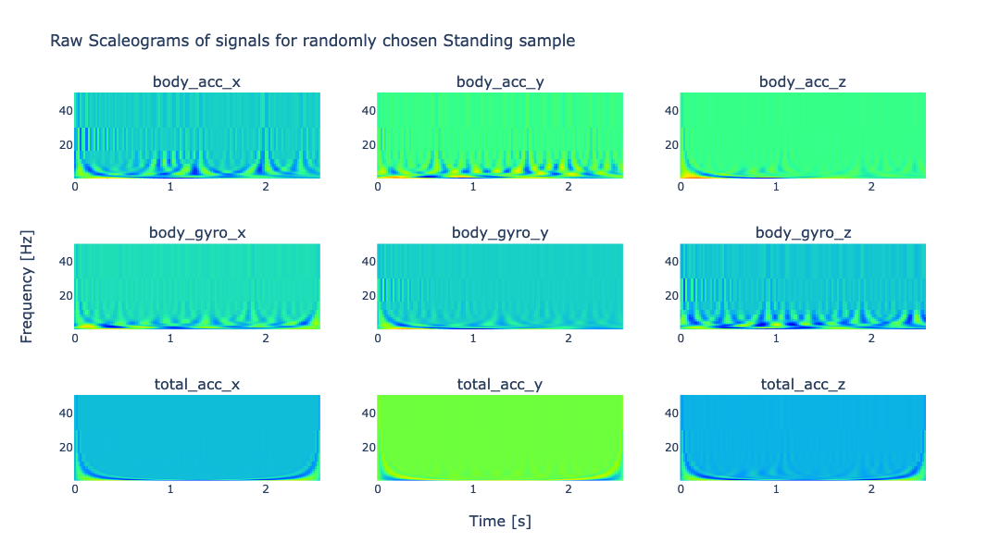

In [45]:
_, frequencies = to_scaleogram(X_train[0], morlet_wavelet, SCALES)
sample_scaleogram = np.load(os.path.join(TRAIN_ROOT, SCALEOGRAM_RAW_DIR, "0.npy"))[np.newaxis, :, :, :]
x_time = np.linspace(0, WINDOW_LEN, SCALEOGRAM_SHAPE[0])
fig = plot_random(
    sample_scaleogram,
    title="Raw Scaleograms of signals for randomly chosen {} sample",
    y_title="Frequency [Hz]",
    x_title="Time [s]",
    plotting_func=partial(plot_scaleogram, x_ax_vals=x_time, y_ax_vals=frequencies),
    signal_extractor=extract_scaleogram
)
fig.show()



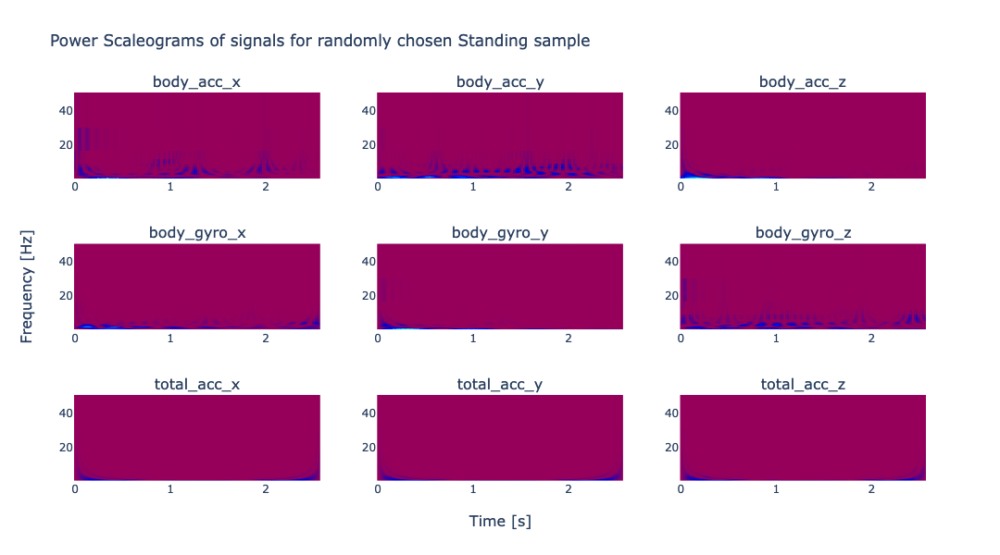

In [46]:
sample_scaleogram = np.load(os.path.join(TRAIN_ROOT, SCALEOGRAM_POWER_DIR, "0.npy"))[np.newaxis, :, :, :]
x_time = np.linspace(0, WINDOW_LEN, SCALEOGRAM_SHAPE[0])
fig = plot_random(
    sample_scaleogram,
    title="Power Scaleograms of signals for randomly chosen {} sample",
    y_title="Frequency [Hz]",
    x_title="Time [s]",
    plotting_func=partial(plot_scaleogram, x_ax_vals=x_time, y_ax_vals=frequencies),
    signal_extractor=extract_scaleogram
)
fig.show()




In [47]:
print(np.max(frequencies))
print(SAMPLING_FREQUENCY)

40.625
50


Remark: Nyquist criterion is not fulfilled which can introduce aliasing for frequencies >= 25 Hz.